In [1]:
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
from scipy.signal import butter, filtfilt
from IPython.display import Audio

# --- Parâmetros gerais ---
fs       = 44100                 # taxa de amostragem
B        = 1500                  # meia-largura da banda (Hz)
ordem_lp = 6                     # ordem do passa-baixas (baseband)

# Centros das faixas (9–12, 12–15, 15–18 kHz)
fc_list  = [10.5e3, 13.5e3, 16.5e3]

# Arquivos de áudio originais (curtos, mono)
files    = ["whatoncewas.wav",
            "heavenknowsimmisearablenow.wav",
            "wonderwall.wav"]


In [2]:
def lowpass(x, fs, fc, ordem):
    """
    Butterworth passa-baixas em fc Hz
    """
    wn = fc/(fs/2)
    b, a = butter(ordem, wn, btype='low')
    return filtfilt(b, a, x)

# Carregar e filtrar cada áudio para 0–B Hz
sinais_bb = []
for fname in files:
    m, fs_file = sf.read(fname)
    assert fs_file == fs
    # LPF para manter só 0–B Hz
    m_filt = lowpass(m, fs, B, ordem_lp)
    sinais_bb.append(m_filt)

# Vetor de tempo (mesmo comprimento para todos)
N = len(sinais_bb[0])
t = np.arange(N) / fs


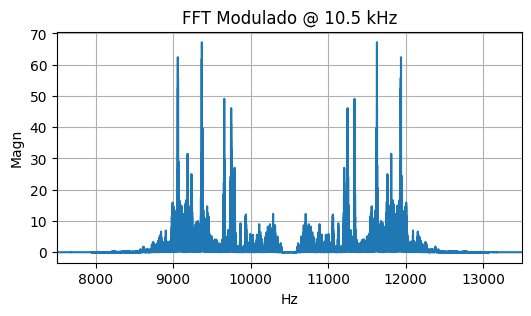

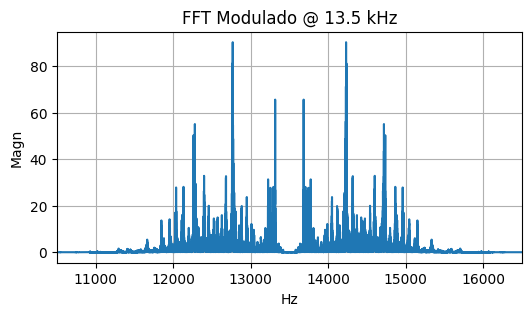

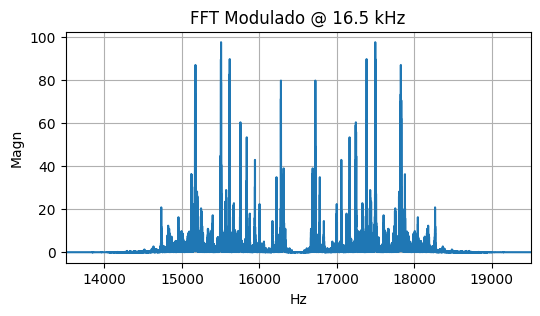

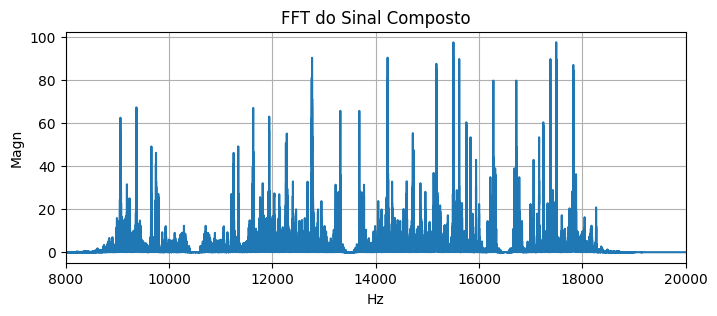

In [3]:
sinais_mod = []

for (m_bb, fc) in zip(sinais_bb, fc_list):
    # 1) Gera portadora com COS para manter fase coerente no receptor
    port = np.cos(2 * np.pi * fc * t)

    # 2) Modula (multiplicação ponto a ponto)
    s_mod = m_bb * port
    sinais_mod.append(s_mod)

    # 3) Checa FFT e áudio modulado
    freqs = np.fft.fftfreq(N, 1/fs)[:N//2]
    mag   = np.abs(np.fft.fft(s_mod))[:N//2]
    plt.figure(figsize=(6,3))
    plt.plot(freqs, mag)
    plt.title(f"FFT Modulado @ {fc/1000:.1f} kHz")
    plt.xlim(fc - 2*B, fc + 2*B)
    plt.xlabel("Hz"); plt.ylabel("Magn"); plt.grid(True)
    plt.show()
    display(Audio(s_mod, rate=fs))

# 4) Soma os três modulados (sinal no “ar”)
sinal_total = sum(sinais_mod)

# 5) FFT do sinal composto e playback
freqs = np.fft.fftfreq(N, 1/fs)[:N//2]
mag   = np.abs(np.fft.fft(sinal_total))[:N//2]
plt.figure(figsize=(8,3))
plt.plot(freqs, mag)
plt.title("FFT do Sinal Composto")
plt.xlim(8e3, 20e3)
plt.xlabel("Hz"); plt.ylabel("Magn"); plt.grid(True)
plt.show()
display(Audio(sinal_total, rate=fs))


# Receptor

Agora vamos implementar a parte do receptor que:
1. Recebe o sinal composto 
2. Filtra para extrair cada banda
3. Demodula para recuperar os sinais originais

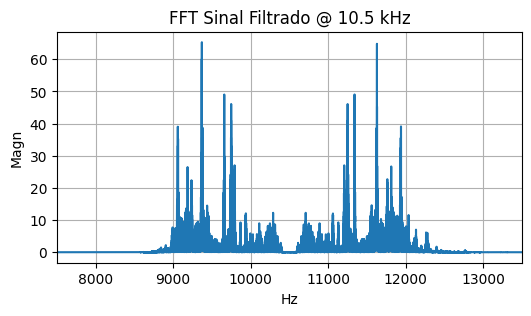

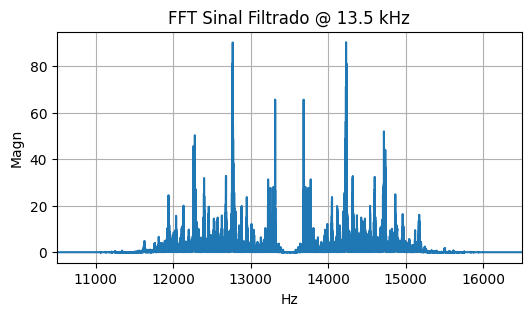

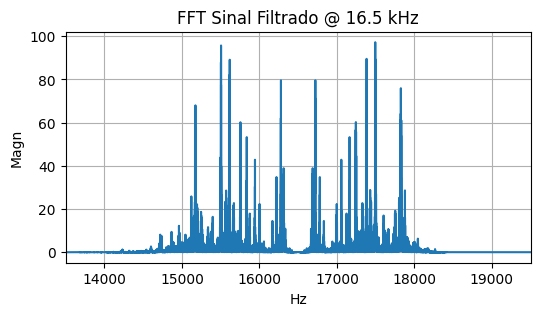

In [4]:
def bandpass(x, fs, flow, fhigh, ordem):
    wl = flow/(fs/2)
    wh = fhigh/(fs/2)
    b, a = butter(ordem, [wl, wh], btype='band')
    return filtfilt(b, a, x)

# Extrai cada banda do sinal composto
sinais_filtrados = []
for fc in fc_list:
    # Filtra o sinal em torno de cada frequência portadora
    # Usa largura de banda de 2B, centrado em fc
    sinal_banda = bandpass(sinal_total, fs, fc-B, fc+B, ordem_lp)
    sinais_filtrados.append(sinal_banda)
    
    # FFT do sinal filtrado
    freqs = np.fft.fftfreq(N, 1/fs)[:N//2]
    mag = np.abs(np.fft.fft(sinal_banda))[:N//2]
    plt.figure(figsize=(6,3))
    plt.plot(freqs, mag)
    plt.title(f"FFT Sinal Filtrado @ {fc/1000:.1f} kHz")
    plt.xlim(fc - 2*B, fc + 2*B)
    plt.xlabel("Hz"); plt.ylabel("Magn"); plt.grid(True)
    plt.show()

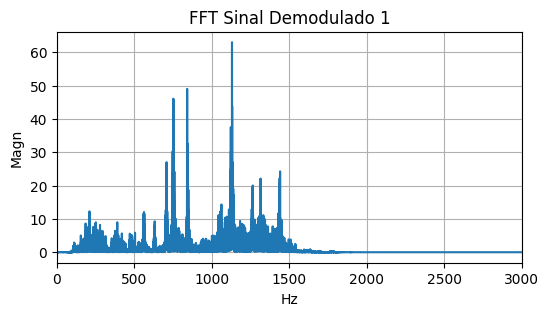

Áudio Recuperado da Faixa 1 (10.5 kHz):


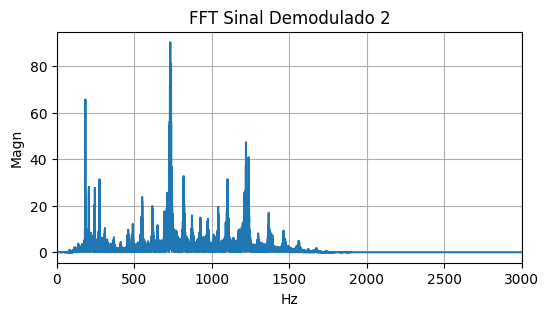

Áudio Recuperado da Faixa 2 (13.5 kHz):


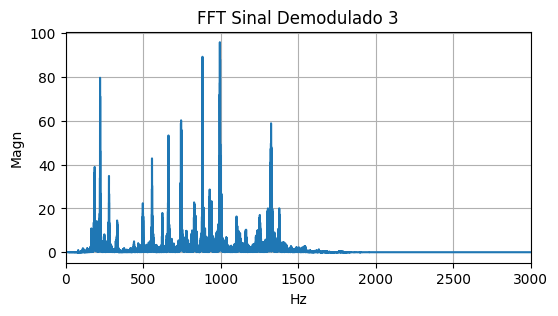

Áudio Recuperado da Faixa 3 (16.5 kHz):


In [5]:
# Demodulação de cada sinal filtrado
sinais_demodulados = []

for i, (sinal_banda, fc) in enumerate(zip(sinais_filtrados, fc_list)):
    # 1) Recria a portadora com mesmo coseno usado na modulação (coerência de fase)
    port = np.cos(2 * np.pi * fc * t)
    
    # 2) Multiplica o sinal pela portadora (demodulação síncrona)
    sinal_demod = sinal_banda * port
    
    # 3) Aplica filtro passa-baixas para recuperar o sinal original
    sinal_recuperado = lowpass(sinal_demod, fs, B, ordem_lp)
    sinais_demodulados.append(sinal_recuperado)
    
    # 4) FFT do sinal recuperado
    freqs = np.fft.fftfreq(N, 1/fs)[:N//2]
    mag = np.abs(np.fft.fft(sinal_recuperado))[:N//2]
    plt.figure(figsize=(6,3))
    plt.plot(freqs, mag)
    plt.title(f"FFT Sinal Demodulado {i+1}")
    plt.xlim(0, 2*B)
    plt.xlabel("Hz"); plt.ylabel("Magn"); plt.grid(True)
    plt.show()
    
    # 5) Playback do sinal recuperado
    print(f"Áudio Recuperado da Faixa {i+1} ({fc/1000:.1f} kHz):")
    display(Audio(sinal_recuperado, rate=fs))

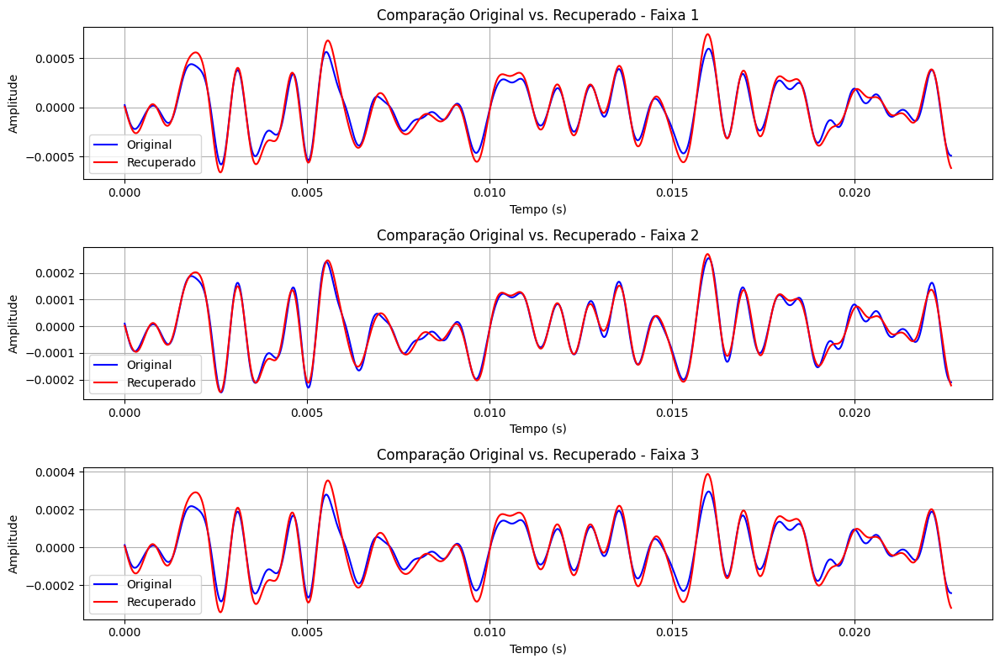

Arquivo recuperado_1.wav salvo com sucesso (amplificado 5.0x)!
Arquivo recuperado_2.wav salvo com sucesso (amplificado 5.0x)!
Arquivo recuperado_3.wav salvo com sucesso (amplificado 5.0x)!


In [6]:
# Comparação com os sinais originais
plt.figure(figsize=(12, 8))

for i, (original, recuperado) in enumerate(zip(sinais_bb, sinais_demodulados)):
    # Normaliza ambos os sinais para melhor comparação
    original_norm = original / np.max(np.abs(original))
    recuperado_norm = recuperado / np.max(np.abs(recuperado))
    
    plt.subplot(3, 1, i+1)
    plt.plot(t[:1000], original_norm[:1000], 'b-', label='Original')
    plt.plot(t[:1000], recuperado_norm[:1000], 'r-', label='Recuperado')
    plt.title(f"Comparação Original vs. Recuperado - Faixa {i+1}")
    plt.xlabel("Tempo (s)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

# Definir fator de amplificação
fator_amplificacao = 5.0  # Ajuste este valor conforme necessário

# Salvar sinais demodulados em arquivos (com amplificação)
for i, sinal in enumerate(sinais_demodulados):
    # Normalizar o sinal
    sinal_norm = sinal / np.max(np.abs(sinal)) if np.max(np.abs(sinal)) > 0 else sinal
    
    # Aplicar amplificação
    sinal_amplificado = sinal_norm * fator_amplificacao
    
    # Garantir que não há clipping (valores entre -1 e 1)
    sinal_amplificado = np.clip(sinal_amplificado, -0.95, 0.95)
    
    arquivo = f"recuperado_{i+1}.wav"
    sf.write(arquivo, sinal_amplificado, fs)
    print(f"Arquivo {arquivo} salvo com sucesso (amplificado {fator_amplificacao}x)!")